# Output plots done by invidivual countries have been removed to meet Github size requirements. They do not reveal much, but can be easily rerun -- they do take time though. 

In [345]:
# libraries 
import numpy as np
import pandas as pd
%matplotlib inline 
import matplotlib.pyplot as plt
from IPython.display import Image

In [24]:
# read in data
data = pd.read_csv("merged_data.csv")

/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (73) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### Note on missing data:

In [239]:
print(np.around((data.isna().sum().sum())/np.prod(data.shape)*100, 4))

39.0007


About 39% of cells are missing values. 

Perhaps we should focus on a reasonable number of variables and decide how to work with missing values for those variables.

### There are some redundant variables.

### Not all countries have all FDI Directions

In [260]:
# grab set of countries
countries = set(data.Country)
# grab sets of directions
for country in countries:
    print("{:<25} | {}".format(country, set(data[data.Country == country]['Direction'])))

Moldova                   | {'FDI inward stock'}
Bulgaria                  | {'FDI inward stock', 'FDI outward stock', 'FDI outflow', 'FDI inflow'}
Ukraine                   | {'FDI inward stock', 'FDI outward stock'}
Latvia                    | {'FDI inward stock', 'FDI outward stock', 'FDI outflow', 'FDI inflow'}
Turkey                    | {'FDI inward stock', 'FDI outward stock'}
Montenegro                | {'FDI inward stock', 'FDI outflow', 'FDI inflow'}
Serbia                    | {'FDI inward stock', 'FDI outward stock', 'FDI outflow', 'FDI inflow'}
Lithuania                 | {'FDI inward stock', 'FDI outward stock', 'FDI outflow', 'FDI inflow'}
Poland                    | {'FDI inward stock', 'FDI outward stock', 'FDI outflow', 'FDI inflow'}
Belarus                   | {'FDI inward stock', 'FDI outward stock'}
Estonia                   | {'FDI inward stock', 'FDI outward stock', 'FDI outflow', 'FDI inflow'}
North Macedonia           | {'FDI inward stock', 'FDI outward stock',

We'll focus on "FDI inward stock" since inward FDI is most relevent. Also, inward stock is the only FDI "Direction" available for all countries of interest. 

In [349]:
# data variables 
print(list(merged_data.columns))

['Unnamed: 0', 'X', 'Tree.Level.1', 'Country.Code', 'Country', 'Direction', 'Partner.Code', 'Partner', 'Unit', 'Footnotes', 'Sources', 'Time', 'Value', 'FDI_type', 'Investor_Development', 'pop_WDI_PW', 'gdppc_WDI_PW', 'growth_WDI_PW', 'lnpop_WDI_PW', 'lngdp_WDI_PW', 'lngdppc_WDI_PW', 'regenv_CPIA', 'proprights_CPIA', 'pubadmin_CPIA', 'strucpol_CPIA', 'traderat_CPIA', 'transpacc_CPIA', 'IDAres_CPIA', 'rank_BZ', 'rank_pi_BZ', 'pi_ip_old_BZ', 'rank_tr_BZ', 'rank_ec_BZ', 'rank_ri_BZ', 'debt_cgov_WDI', 'fdi_inper_WDI', 'fdi_outper_WDI', 'fdidollars_WDI', 'gdp_WDI', 'gdppc_WDI', 'gini_WDI', 'gni_WDI', 'GNI_growth_WDI', 'gnipc_WDI', 'govexp_edu_WDI', 'govt_consump_WDI', 'growth_WDI', 'legal_rt_WDI', 'migrant_per_WDI', 'migrant_tot_WDI', 'natresource_rents_WDI', 'netoda_WDI', 'pop_WDI', 'pop_den_WDI', 'remittances_WDI', 'reserves_tot_WDI', 'trade_WDI', 'trade_services_WDI', 'worker_CR', 'injud_CR', 'numgov_DPI', 'numvote_DPI', 'numopp_DPI', 'oppvote_DPI', 'maj_DPI', 'gov1me_DPI', 'gov1seat_DPI

### Some notes and ideas on the variables in general

In the dataset, we have a given (year, country, partner) tuple and a variable set for the "country" in that tuple. Given a tuple, we would like to attribute a difference of effect on the set of "country variables" by FDI and its place of origin eg if the partner country is among the more well-institutioned countries versus those not as well-institutioned. However, it may be difficult to notice this effect in variables like GDP. 

Given a variable like GDP for a given year, we may not be able to reliably attribute a change in such a variable to inward stock/flow among many, many outside/confounding variables both present and past. We would think that a variable like GDP is a function in no small part of the past, so the effect of inward flow/stock in one year from one particular country may not be readily apparent. However, this may be more easily done with variables that look at attributes like growth (eg GDP growth) that are less so a factor of the past. Further, we should ponder whether we can reliably distinguish the effects of the inward stock/flow variable in a given year on some other variable within that year ie we might perhaps expect a lag. Perhaps introducing a one year lag would help the effects of FDI year to year become more apparent. 

(I am not sure if this next suggestion is principled. I'll have to look into the literature, but it's just a thought for now). We can look into percent changes in variables from year to year, which would have the effect of turning the time series data into time-independent data more akin to sampling ie we may be able to decouple the year from the data by taking a difference (or some other function) of variables over consecutive years. As it is now, given a (year, country, partner) tuple, we would like to attribute a difference in the effect the FDI variable has on another variable through the varying partner countries. But, the time component complicates things. If we instead, for example, look at percent changes, we can move to a (country, partner) pair that may make it easier to attribute changes in that country's variable set to the different amounts and locations of incoming FDI. This, of course, is more apt for some variables over others. Analyses can take into account the effect of time, but it may be worthwhile to expand into analyses that look at data as observational samples not completely dependent on the year. 

Having the data without differences between years makes the plotting of FDI by another variable not as informative as it could be. Almost all plots seems to show no correlation. 

I've tested plots where I incorporate FDI amounts into the plot as the marker size, but that does not reveal anything substantial either. 

I think variables like those in the VDEM category may be incredibly useful to analyse in the context of differences between years ie if inflow increased substantially in one year, then we might expect the number of opposition seats to decline, which would be more apparent as a difference between years. 

Importantly, in regards to adding a lag, the amount of lag would need to be discussed for variables like in the VDEM category because elections do not necessarily take place every year. For example, if FDI were being fueled to oust opposition in the US (if it were a multi-party country), there would be a lag of two years. 

### Filters for the data

In [263]:
# filters and useful variables
units = ["EUR mn", "in % of total"]
inward_stock_filter = data.Direction == "FDI inward stock"
inflow_filter = data.Direction == "FDI inflow"
eur_filter = data.Unit == "EUR mn"
perc_filter = ~eur_filter
no_world_filter = data["Partner.Code"] != "WORLD"
no_EU_entity = data.FDI_type == 0
true_filter = pd.Series(['True']*data.shape[0], dtype=bool)

### Plotting Functions

In [301]:
def graph_fdi_by_var_over_countries(var, filters, ttl='FDI Over Countries', direction="FDI inward stock"):
    
    ##########
    # FDI direction amount plotted vs a variable
    # ---plotted over all countires labelled by each country
    # filters is a list of filters to apply to the data before plotting
    ##########
    
    # grab global data object
    global data
    
    # loop over units of FDI --scatter plot for each unit
    for u__ in units:
        
        # filters
        temp_filt = pd.Series(['True']*data.shape[0], dtype=bool)
        for filt in filters:
            temp_filt = temp_filt & filt

        # unit logic 
        if u__ == "EUR mn":
            temp_filt = temp_filt & eur_filter
        else:
            temp_filt = temp_filt & perc_filter
        
        # create temp data with filterss
        temp_df = data[temp_filt]
        
        # filter for direction
        temp_df = temp_df[temp_df["Direction"] == direction]
            
        # begin plot
        fig, ax = plt.subplots(1, 1, figsize=(16, 9))

        # scatter over groups of countries
        for c__, group__ in temp_df.groupby("Country"):
            ax.scatter(group__["Value"].values, 
                       group__[var].values,
                       label = c__, alpha=0.5)
            
        # unit logic
        if u__ == "EUR mn":
            ax.set_xlabel(str(direction) + ' (EUR mn)', fontsize=14)
        else:
            ax.set_xlabel(str(direction) + ' (in % of total)', fontsize=14)
            
        # plot
        ax.set_ylabel(var, fontsize=14) 
        ax.set_title(ttl, fontsize=14)
        ax.legend(bbox_to_anchor=(1., 1.), title="Country");

In [302]:
def graph_fdi_by_var_over_indiv_countries(country, var, filters, ttl='', direction="FDI inward stock"):
    
    ##########
    # FDI direction amount plotted vs a variable
    # ---plotted over a specific country and grouped/labelled by partner country
    # filters is a list of filters to apply to the data before plotting
    ##########    
    
    # grab global data object
    global data
    
    # loop over units of FDI --scatter plot for each unit
    for u__ in units:
        
        # filters
        temp_filt = pd.Series(['True']*data.shape[0], dtype=bool)
        for filt in filters:
            temp_filt = temp_filt & filt

        # unit logic 
        if u__ == "EUR mn":
            temp_filt = temp_filt & eur_filter
        else:
            temp_filt = temp_filt & perc_filter
        
        # create temp data with filters
        temp_df = data[temp_filt]
        
        # filter for direction
        temp_df = temp_df[temp_df["Direction"] == direction]
        
        # filter for country 
        temp_df = temp_df[temp_df["Country"] == country]
            
        # begin plot
        fig, ax = plt.subplots(1, 1, figsize=(16, 9))

        # scatter over groups of partner countries 
        for p__, group__ in temp_df.groupby("Partner"):
            ax.scatter(group__["Value"].values, 
                       group__[var].values,
                       label = p__, alpha=0.99)
        
        # unit logic 
        if u__ == "EUR mn":
            ax.set_xlabel(str(direction) + ' (EUR mn)', fontsize=14)
        else:
            ax.set_xlabel(str(direction) + ' (in % of total)', fontsize=14)
            
        # plot
        ax.set_ylabel(var, fontsize=14) 
        if ttl == '':
            ax.set_title(str(country), fontsize=14)
        else:
            ax.set_title(ttl, fontsize=14)
        ax.legend(bbox_to_anchor=(1., 1.), title="Partner");

In [303]:
def graph_fdi_by_var_over_investor_development(var, filters, ttl='FDI Over Investor Development',
                                               direction="FDI inward stock"):
    
    ##########
    # FDI direction amount plotted vs a variable
    # ---plotted over all countries and labelled by investor development
    # filters is a list of filters to apply to the data before plotting
    ##########    
    
    # grab global data object
    global data
    
    
    # loop over units of FDI --scatter plot for each unit
    for u__ in units:
        
        # filters
        temp_filt = pd.Series(['True']*data.shape[0], dtype=bool)
        for filt in filters:
            temp_filt = temp_filt & filt

        # unit logic 
        if u__ == "EUR mn":
            temp_filt = temp_filt & eur_filter
        else:
            temp_filt = temp_filt & perc_filter
            
        # create temp data with filters
        temp_df = data[temp_filt]
        
        # filter for direction
        temp_df = temp_df[temp_df["Direction"] == direction]
            
        # begin plot
        fig, ax = plt.subplots(1, 1, figsize=(16, 9))

        # scatter over investor development
        ax.scatter(temp_df[temp_df["Investor_Development"] == 1]["Value"].values, 
                   temp_df[temp_df["Investor_Development"] == 1][var].values, 
                   label = "1", alpha=0.5)
        ax.scatter(temp_df[temp_df["Investor_Development"] == 0]["Value"].values, 
                   temp_df[temp_df["Investor_Development"] == 0][var].values, 
                   label = "0", alpha=0.5)
        
        # unit logic 
        if u__ == "EUR mn":
            ax.set_xlabel(str(direction) + ' (EUR mn)', fontsize=14)
        else:
            ax.set_xlabel(str(direction) + ' (in % of total)', fontsize=14)
            
        # plot
        ax.set_ylabel(var, fontsize=14) 
        ax.set_title(ttl, fontsize=14)
        ax.legend(bbox_to_anchor=(1., 1.), title="Investor Development");

In [304]:
def graph_fdi_by_var_over_invesotr_development_indiv_countries(country, var, filters, ttl='', 
                                                               direction="FDI inward stock"):
    
    ##########
    # FDI direction amount plotted vs a variable
    # ---plotted over a specific country and grouped/labelled by investor development
    # filters is a list of filters to apply to the data before plotting
    ##########    
    
    # grab global data object
    global data
    
    # loop over units of FDI --scatter plot for each unit
    for u__ in units:
        
        # filters
        temp_filt = pd.Series(['True']*data.shape[0], dtype=bool)
        for filt in filters:
            temp_filt = temp_filt & filt

        # unit logic 
        if u__ == "EUR mn":
            temp_filt = temp_filt & eur_filter
        else:
            temp_filt = temp_filt & perc_filter
        
        # create temp data with filters
        temp_df = data[temp_filt]
        
        # filter for direction
        temp_df = temp_df[temp_df["Direction"] == direction]
        
        # filter for country 
        temp_df = temp_df[temp_df["Country"] == country]
            
        # begin plot
        fig, ax = plt.subplots(1, 1, figsize=(16, 9))

        # scatter over investor development by partner country
        ax.scatter(temp_df[temp_df["Investor_Development"] == 1]["Value"].values, 
                   temp_df[temp_df["Investor_Development"] == 1][var].values, 
                   label = "1", alpha=0.99)
        ax.scatter(temp_df[temp_df["Investor_Development"] == 0]["Value"].values, 
                   temp_df[temp_df["Investor_Development"] == 0][var].values, 
                   label = "0", alpha=0.99)
        
        # unit logic 
        if u__ == "EUR mn":
            ax.set_xlabel(str(direction) + ' (EUR mn)', fontsize=14)
        else:
            ax.set_xlabel(str(direction) + ' (in % of total)', fontsize=14)
            
        # plot
        ax.set_ylabel(var, fontsize=14) 
        if ttl == '':
            ax.set_title(str(country), fontsize=14)
        else:
            ax.set_title(ttl, fontsize=14)
        ax.legend(bbox_to_anchor=(1., 1.), title="Investor Development");

### Looking at GDP in relation to FDI 

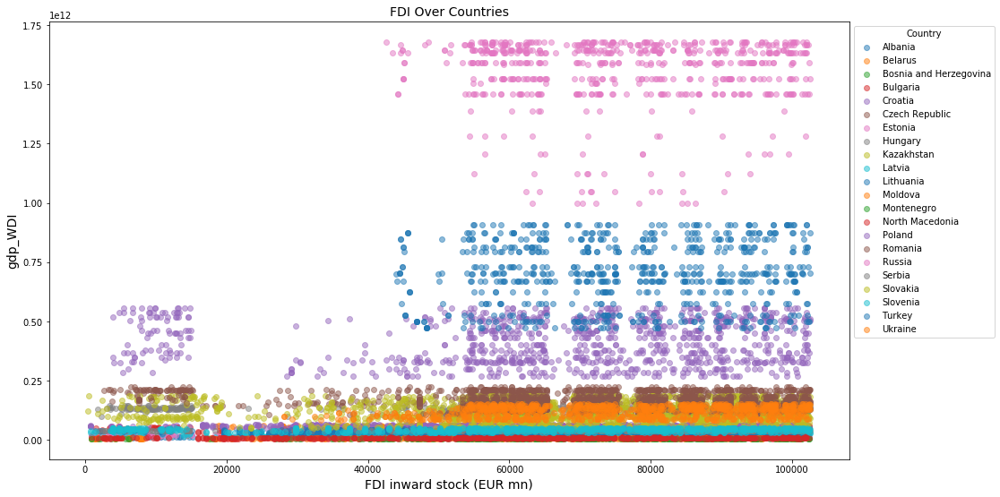

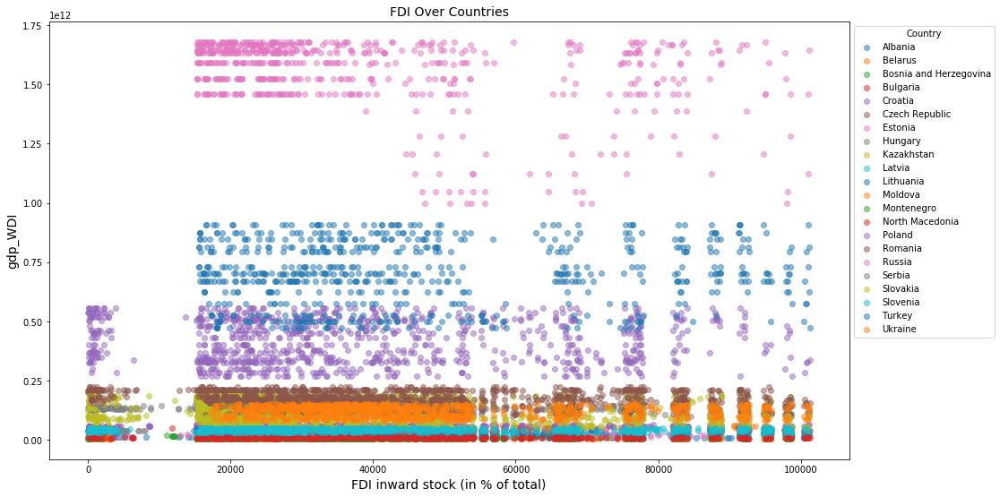

In [305]:
graph_fdi_by_var_over_countries("gdp_WDI",
                                [no_world_filter, no_EU_entity])

We don't really see a relationship in the above plots. We do not have information on the year of each plotted point, but it appears that, for the most part, the amount of inward stock for a given year does not have a significant effect on the GDP for that year. 

-

-

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, "gdp_WDI", [])

I do not think we can anything away from the above set of plots. It's plotted simply to be plotted -- and perhaps an observation can be made -- but nothing appears to be conveyed. 

-

-

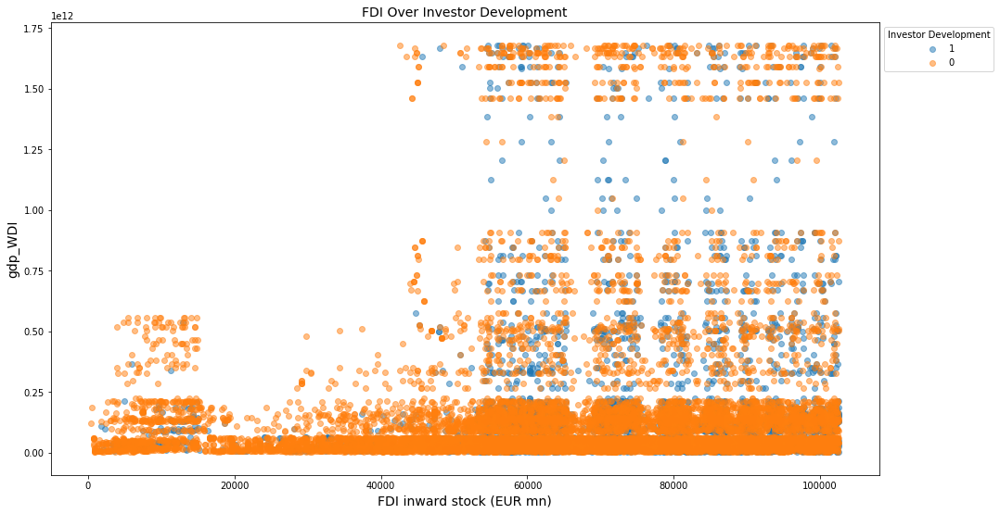

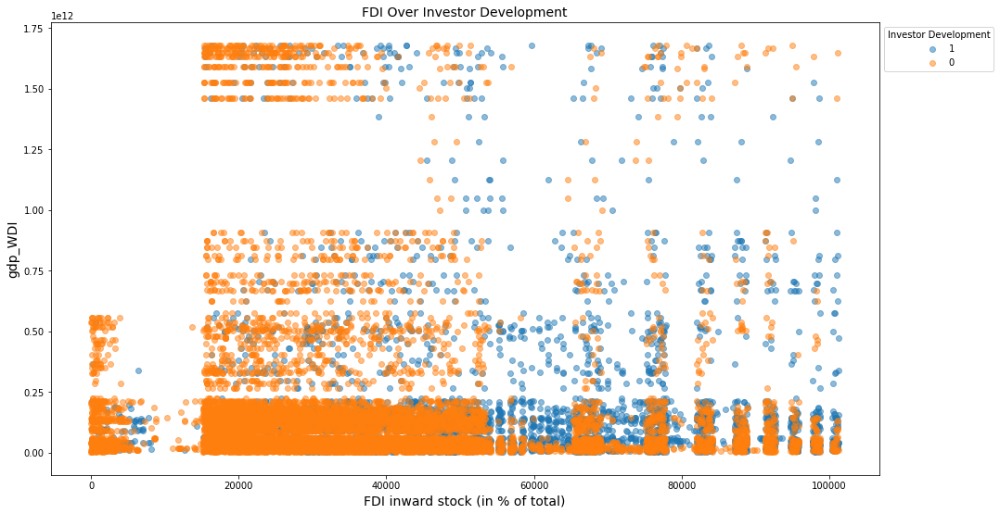

In [307]:
graph_fdi_by_var_over_investor_development("gdp_WDI", 
                                [no_world_filter, no_EU_entity])

I don't think we can garner much from this plot either. 

-

-

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, "gdp_WDI", [])

I'm not sure we can garner much from this plot either. 

--

--

### Looking at GDP per capita in relation to FDI 

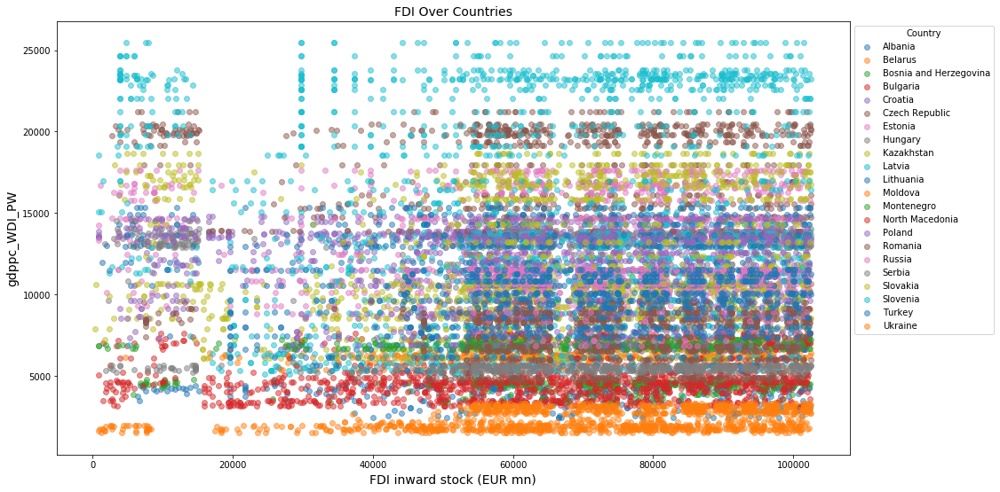

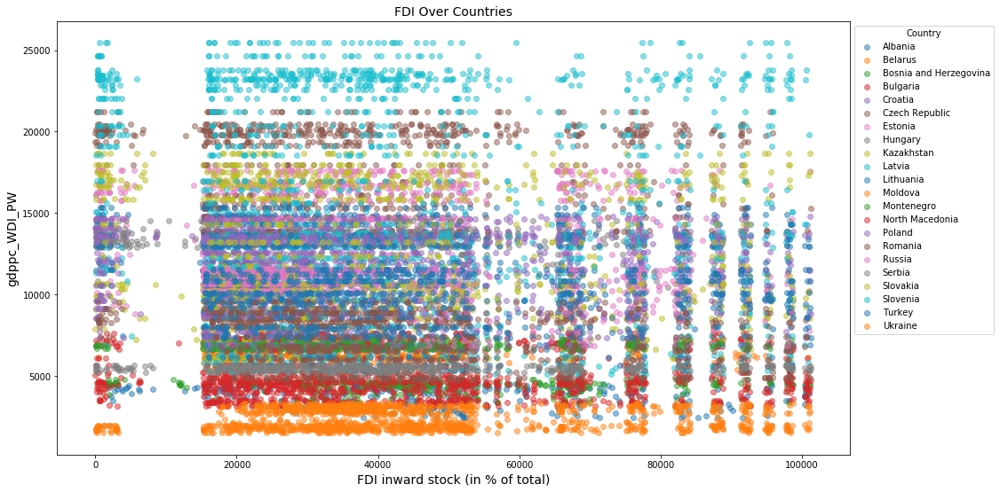

In [309]:
graph_fdi_by_var_over_countries("gdppc_WDI_PW",
                                [no_world_filter, no_EU_entity])

Not much information here. 

-

-

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, "gdppc_WDI_PW", [])

I do not think we can anything away from the above set of plots. It's plotted simply to be plotted -- and perhaps an observation can be made -- but nothing appears to be conveyed. 

-

-

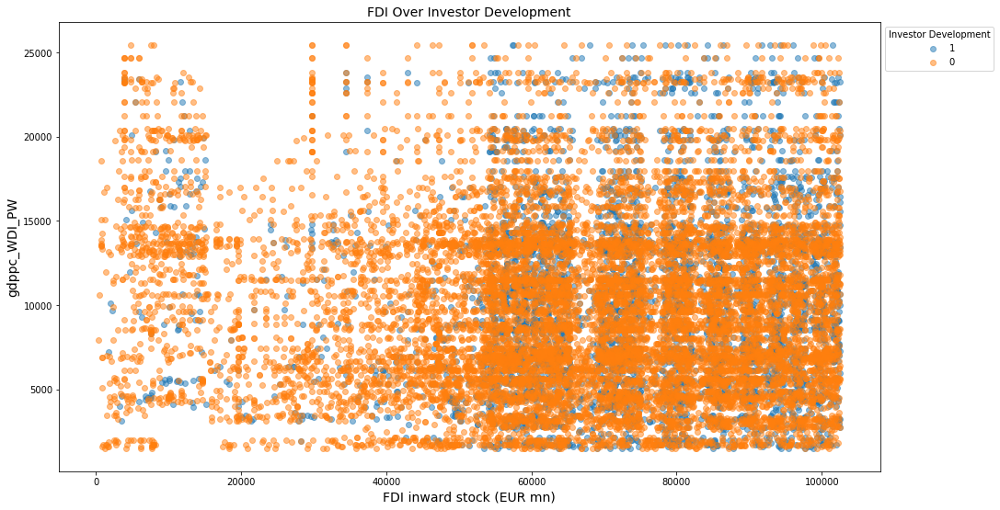

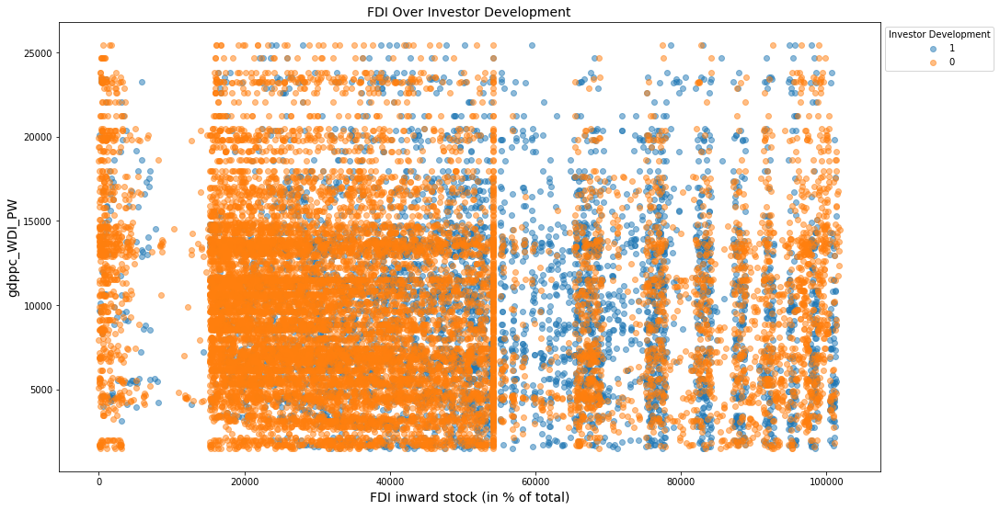

In [311]:
graph_fdi_by_var_over_investor_development("gdppc_WDI_PW", [])

Not much information here. 

-

-

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, "gdppc_WDI_PW", [])

Not much information here.

--

--

### Looking at GDP growth in relation to FDI 

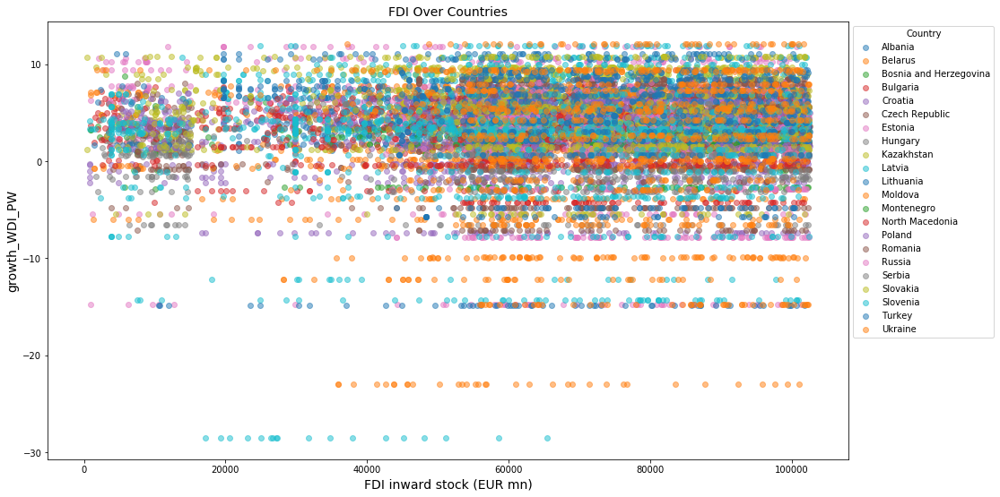

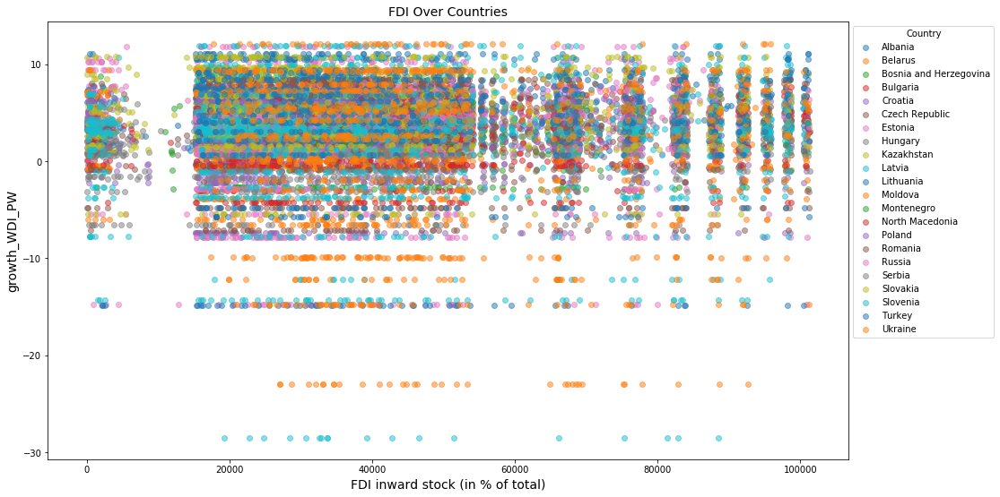

In [313]:
graph_fdi_by_var_over_countries("growth_WDI_PW",
                                [no_world_filter, no_EU_entity])

-

-

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, "growth_WDI_PW", [])

-

-

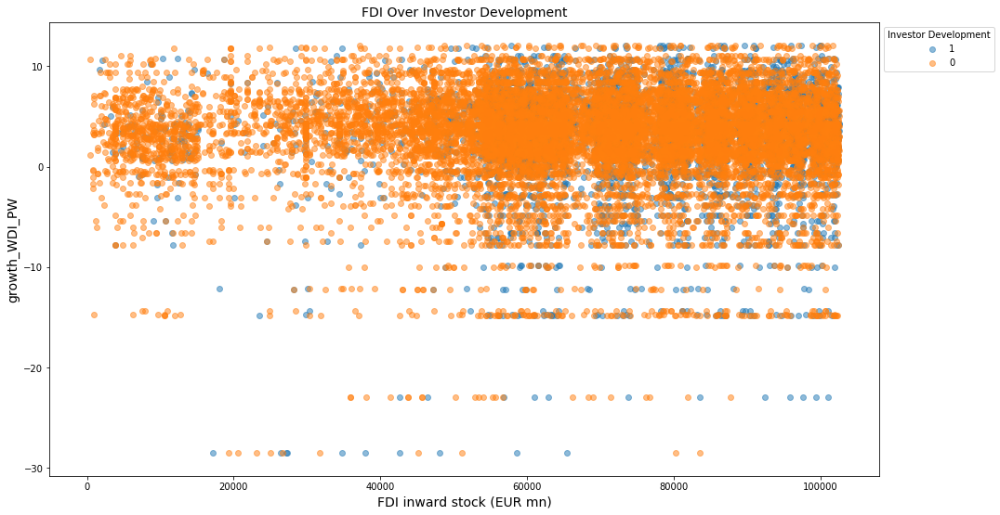

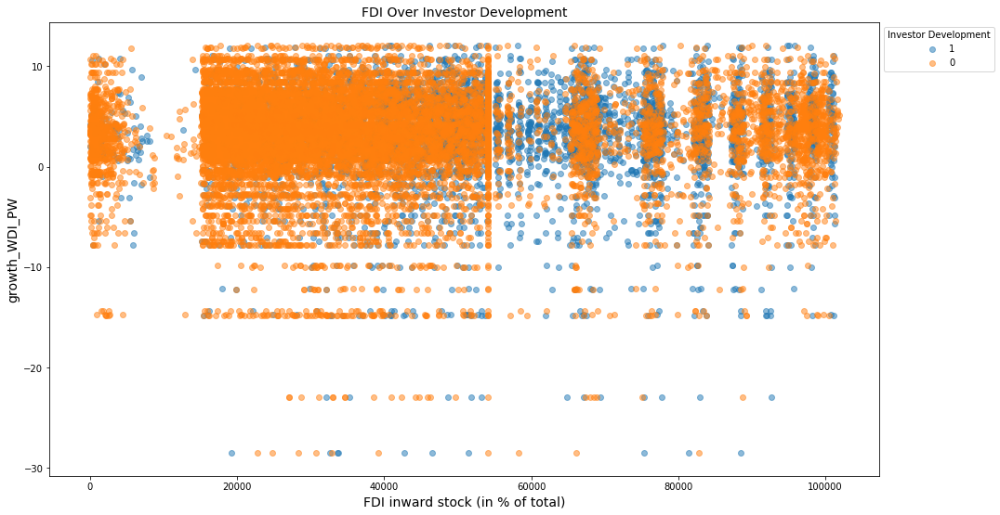

In [315]:
graph_fdi_by_var_over_investor_development("growth_WDI_PW", [])

-

-

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, "growth_WDI_PW", [])

### Looking at log GDP in relation to FDI 

In [318]:
var = "lngdp_WDI_PW"

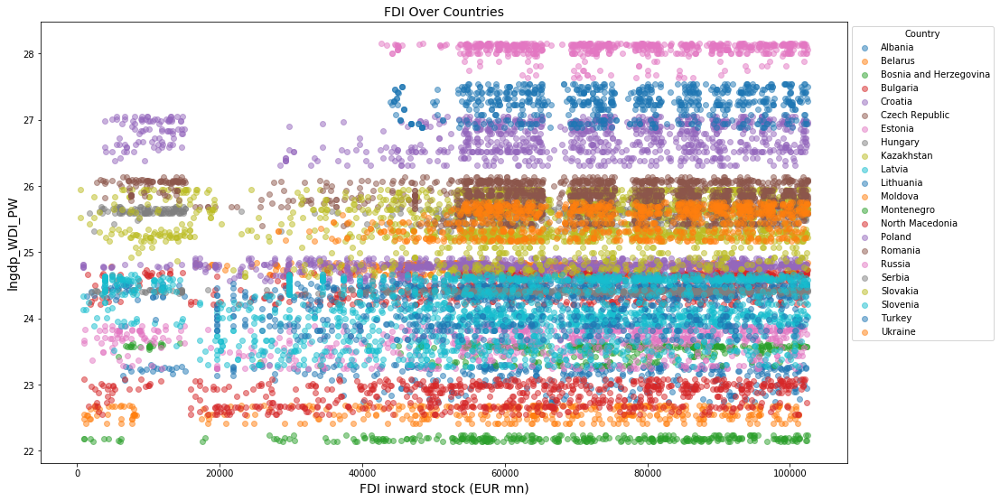

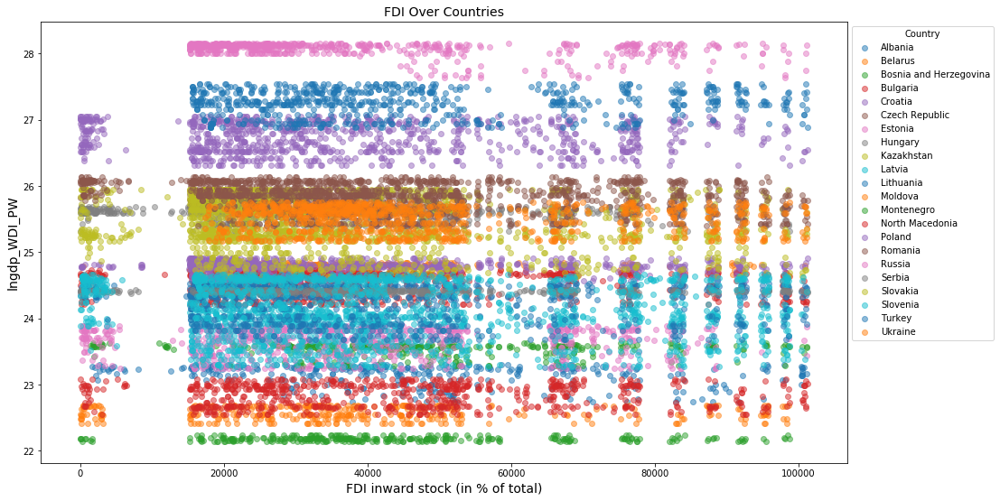

In [319]:
graph_fdi_by_var_over_countries(var,
                                [no_world_filter, no_EU_entity])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, var, [])

--

--

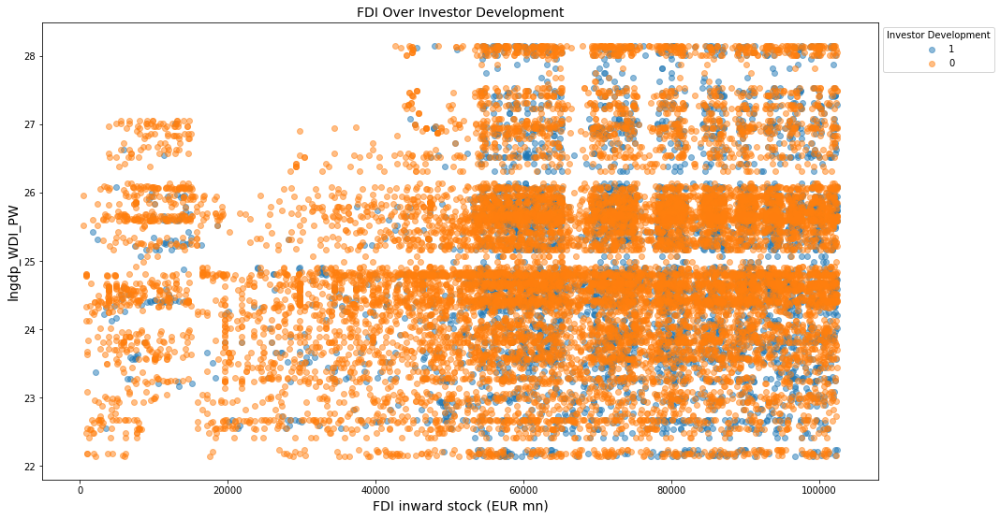

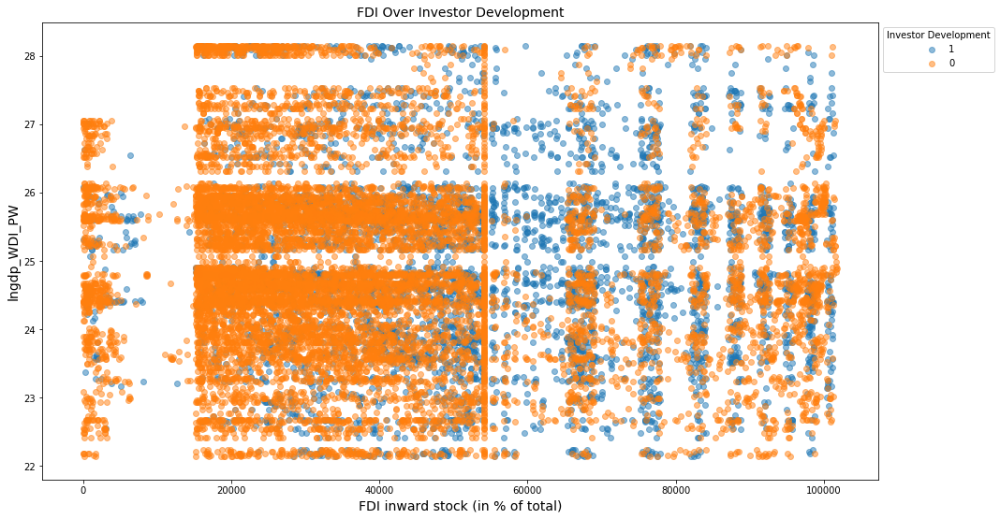

In [321]:
graph_fdi_by_var_over_investor_development(var, [])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, var, [])

### CPIA business regulatory environment rating (1=low to 6=high) [CPIA] - regenv_CPIA

In [339]:
print(np.mean(data.regenv_CPIA.isna()))

0.9854988980164295


In [348]:
print(set(data[~np.isnan(data.regenv_CPIA)]["Country"]))

{'Bosnia and Herzegovina', 'Moldova'}


We only have data available for this variable from the above two countries. Variable is not useful. 

Below is an image of the available data. 

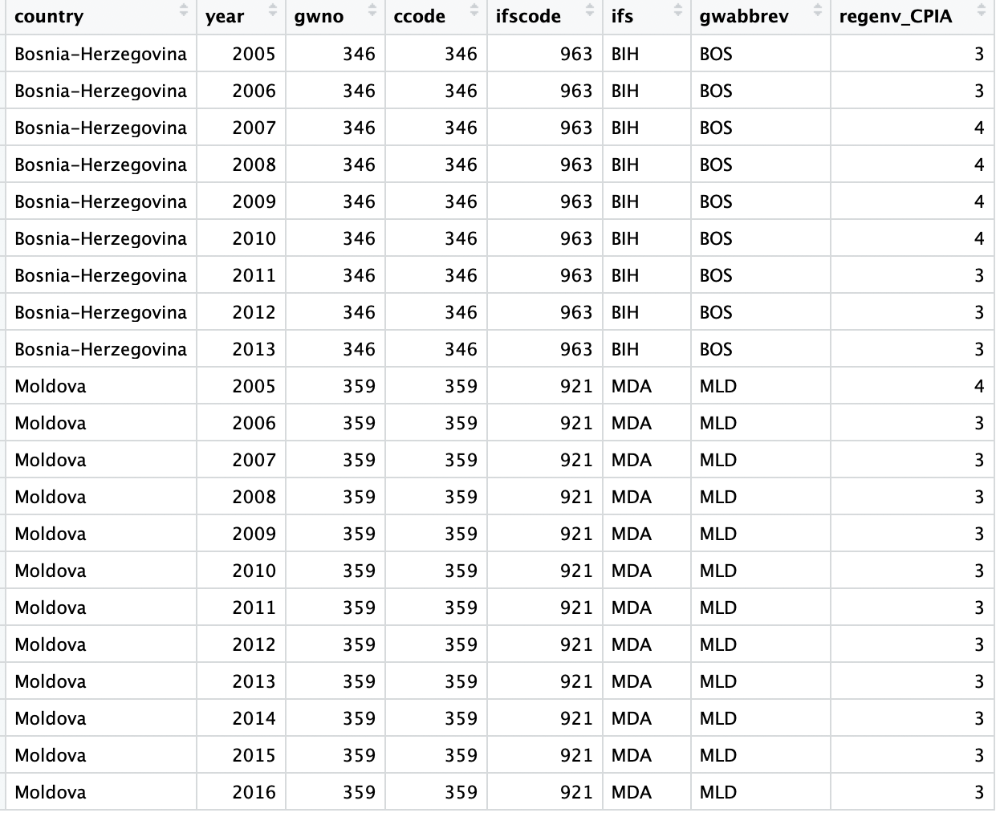

In [360]:
display(Image(filename='images/regenv_cpia_nonNA.png', width=750))

Perhaps there could have been something useful to do with this variable, but it seems useless. 

### CPIA property rights and rule-based governance rating (1=low to 6=high) [CPIA] - proprights_CPIA

Same issue with this variable as with the CPIA business regulatory environment rating.

### CPIA quality of public administration rating (1=low to 6=high) [CPIA] - pubadmin_CPIA

Same issue with this variable as with the CPIA business regulatory environment rating.

### CPIA structural policies cluster average (1=low to 6=high) [CPIA] - strucpol_CPIA

Same issue with this variable as with the CPIA business regulatory environment rating.

### CPIA trade rating (1=low to 6=high) [CPIA] - traderat_CPIA

Same issue with this variable as with the CPIA business regulatory environment rating.

### CPIA transparency, accountability, and corruption in the public sector rating (1=low to 6=high) [CPIA] - transpacc_CPIA

Same issue with this variable as with the CPIA business regulatory environment rating.

### IDA resource allocation index (1=low to 6=high) [CPIA] - IDAres_CPIA

Same issue with this variable as with the CPIA business regulatory environment rating.

### Ease of Doing Business Rank [WB_Biz] - rank_BZ

Too much missing data. 

### Protecting Investors Rank [WB_Biz]  - rank_pi_BZ

Too much missing data.

### Protecting Minority Investors, strength of investor protection index (0-10) old methodology [WB_Biz] - pi_ip_old_BZ

Too much missing data.

### Trading Across Borders, cost to export (US dollars per container) [WB_Biz] - rank_tr_BZ

Too much missing data.

### Enforcing Contracts Rank [WB_Biz] - rank_ec_BZ

Too much missing data.

### Resolving Insolvency Rank [WB_Biz] - rank_ri_BZ

Too much missing data.

### Central government debt, total (% of GDP) [WDI]  - debt_cgov_WDI

Good portion of data available, but not sure about its link to the aims.

### Foreign direct investment, net inflows (% of GDP) [WDI] - fdi_inper_WDI

Superfluous variable.

### Foreign direct investment, net outflows (% of GDP) [WDI] - fdi_outper_WDI

Superfluous variable, and outflows probably not as important. 

### Foreign direct investment, net inflows (BoP, current US dollars) [WDI] - fdidollars_WDI

Superfluous variable.

### GINI index [WDI]  - gini_WDI

In [366]:
var = "gini_WDI"

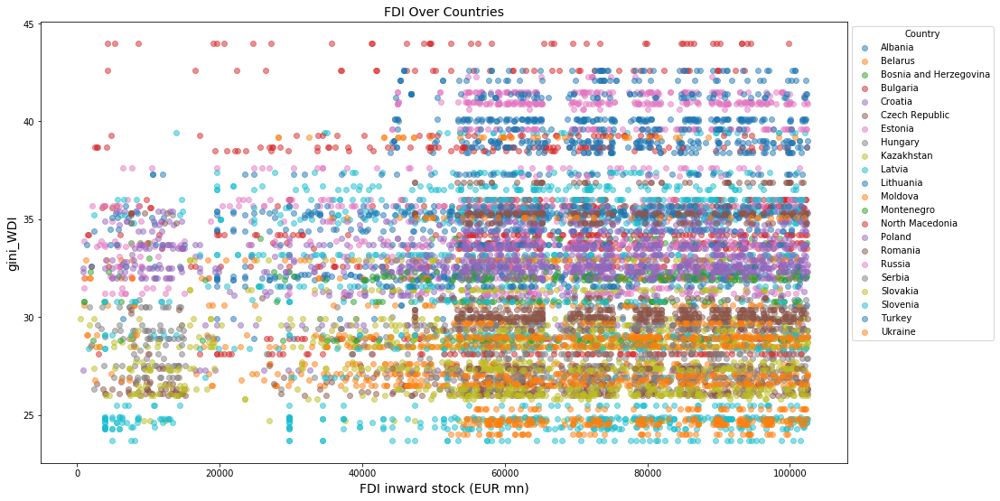

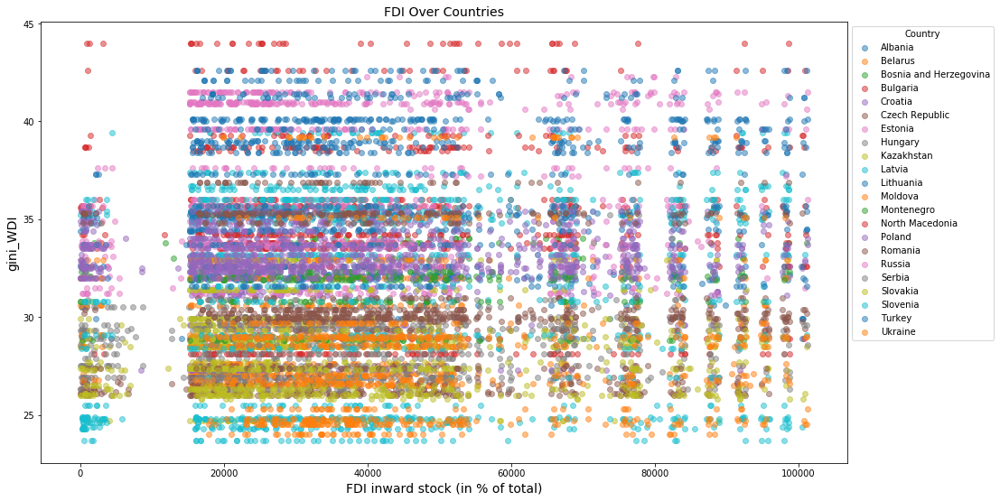

In [367]:
graph_fdi_by_var_over_countries(var, [no_world_filter, no_EU_entity])

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, var, [])

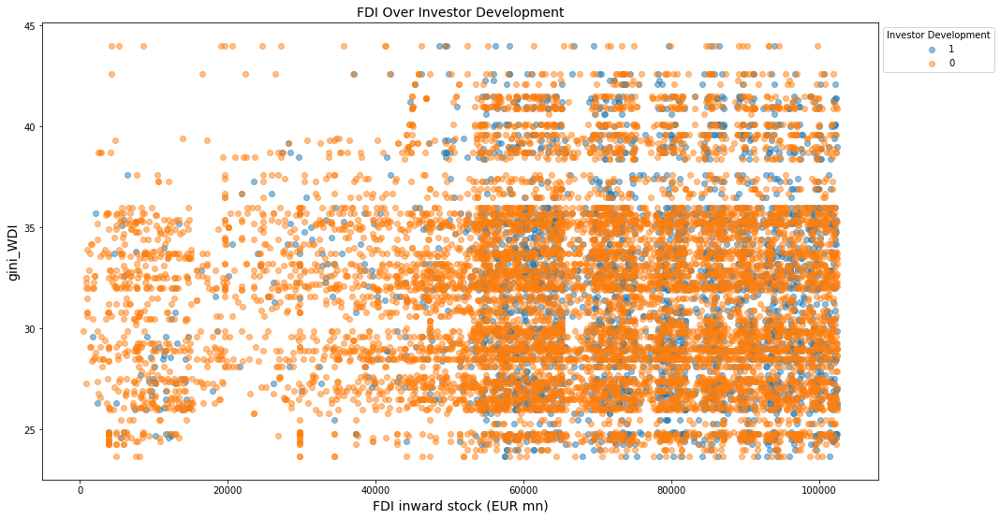

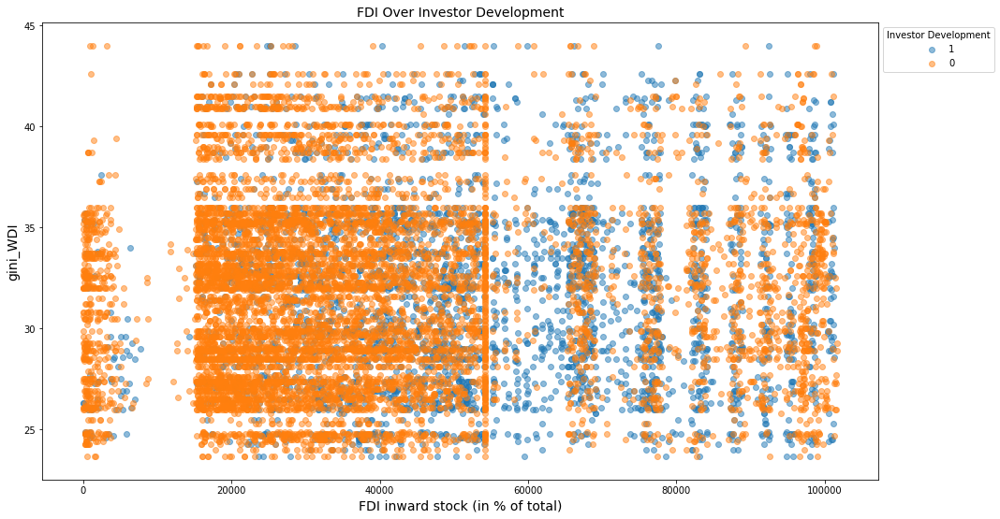

In [372]:
graph_fdi_by_var_over_investor_development(var, [])

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, var, [])

--

--

### Government expenditure on education, total (% of GDP) [WDI] - govexp_edu_WDI

More than half the data missing.

### Strength of legal rights index (0=weak to 12=strong) [WDI]   - legal_rt_WDI

Too much missing data.

### International migrant stock (% of population) [WDI]  - migrant_per_WDI

Too much missing data. 

### International migrant stock, total [WDI]  - migrant_tot_WDI

Too much missing data. 

### Net official development assistance received (current US dollars) [WDI] - netoda_WDI

More than sixty percent of data missing. 

### Number of Government Seats [DPI] - numgov_DPI

Regular plots are below, but one would think the number of government seats would not change often. 

In [443]:
var = "numgov_DPI"

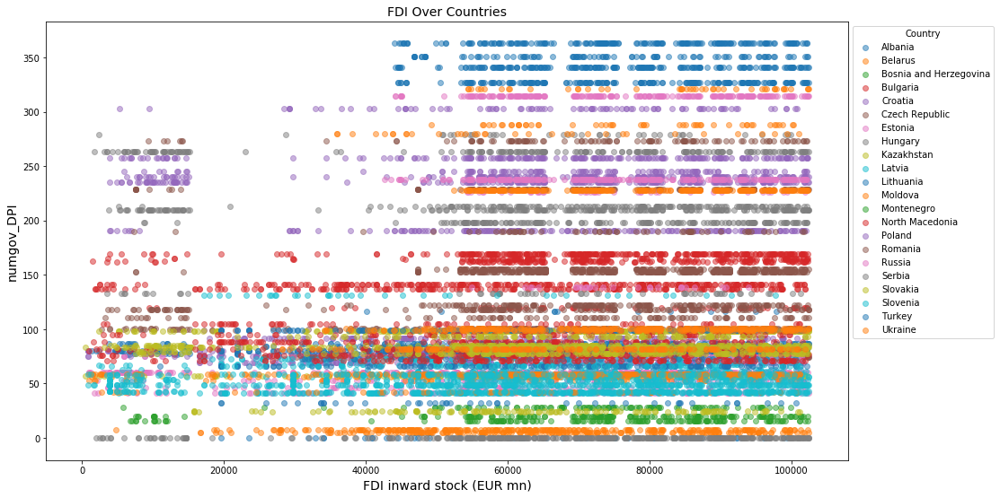

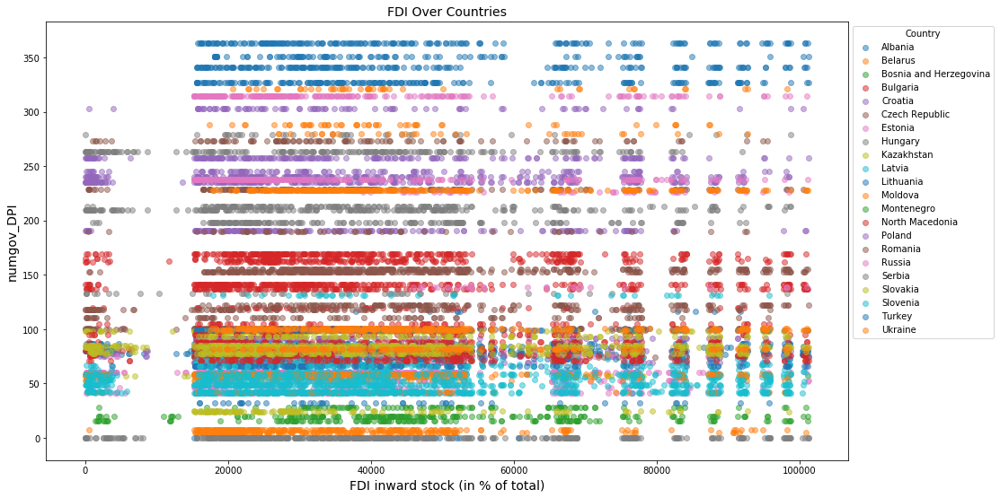

In [444]:
graph_fdi_by_var_over_countries(var, [no_world_filter, no_EU_entity])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, var, [])

--

--

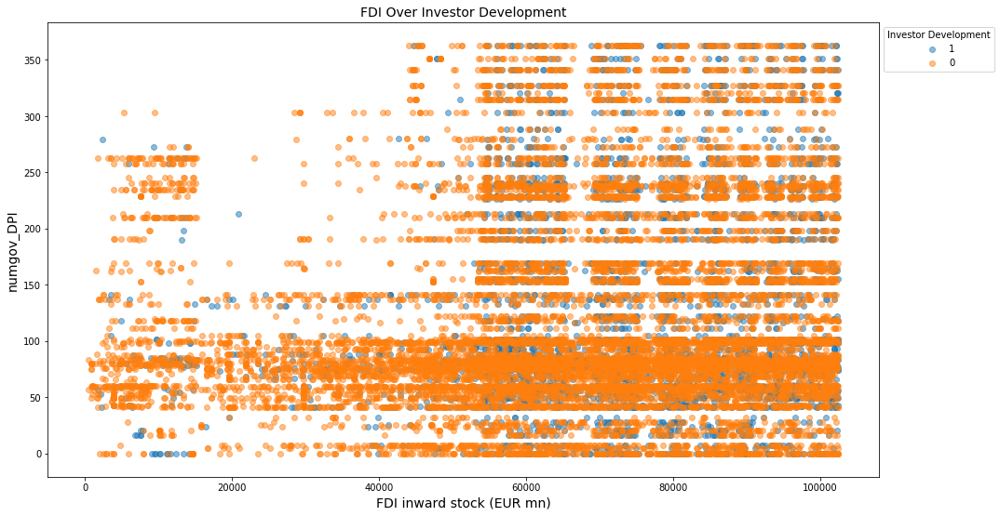

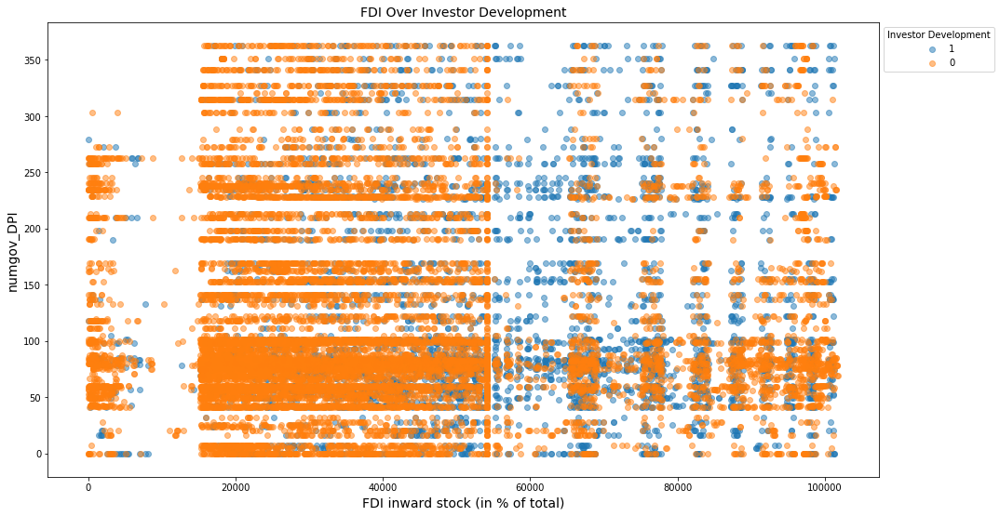

In [446]:
graph_fdi_by_var_over_investor_development(var, [])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, var, [])

--

--

### Vote Share of Government Parties [DPI] - numvote_DPI

In [449]:
var = "numvote_DPI"

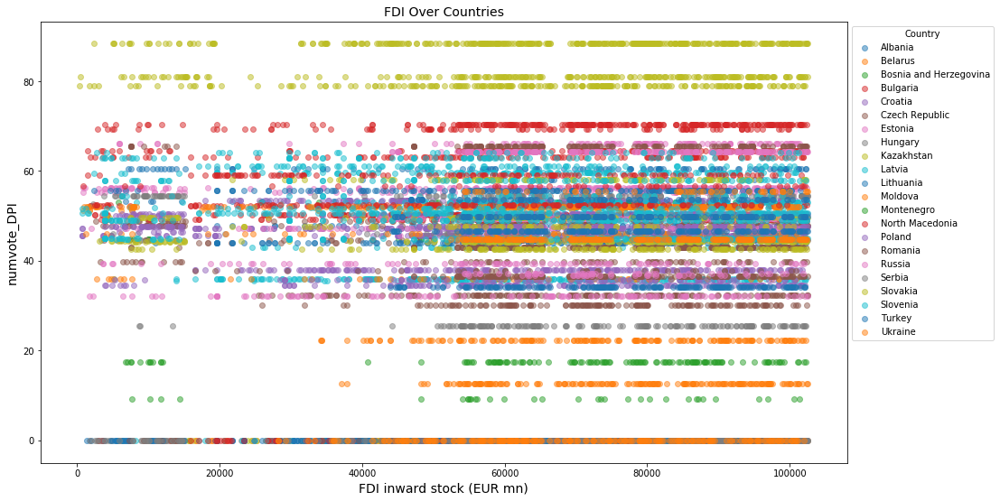

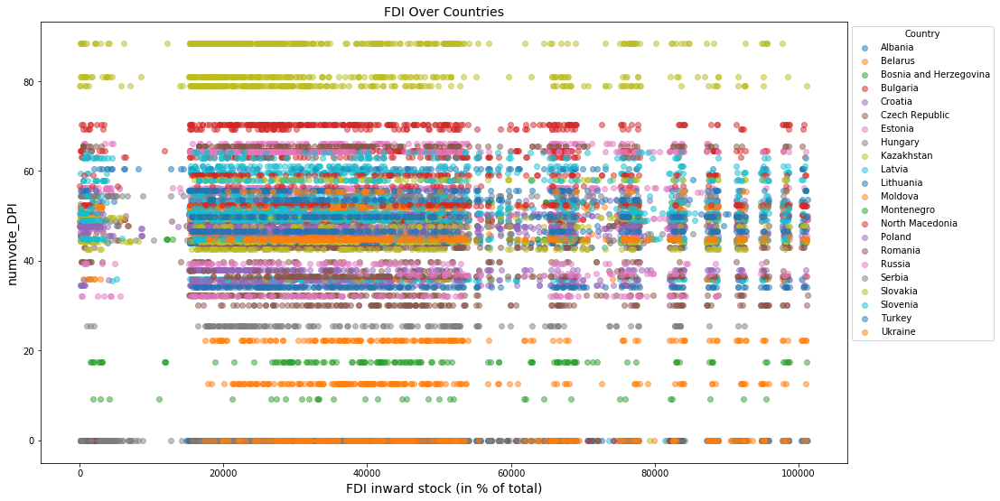

In [450]:
graph_fdi_by_var_over_countries(var,
                                [no_world_filter, no_EU_entity])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, var, [])

--

--

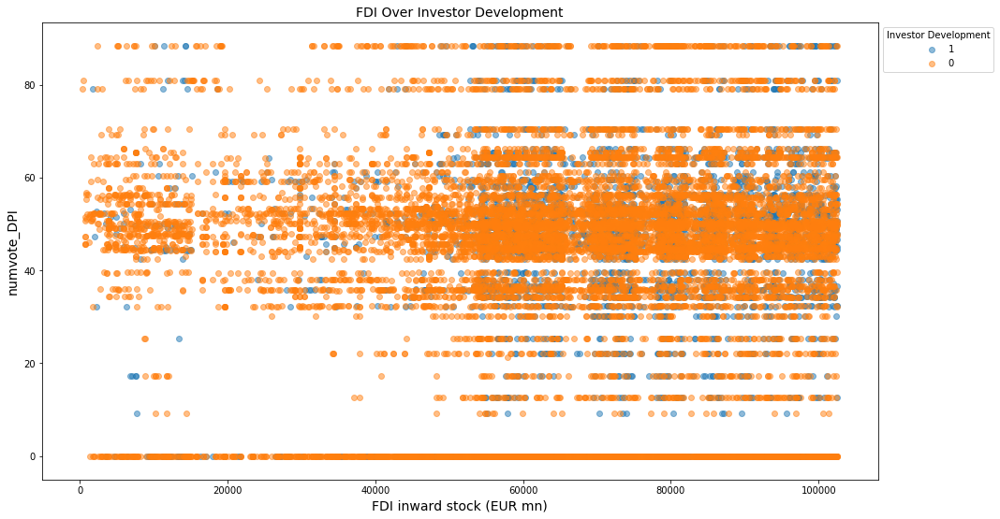

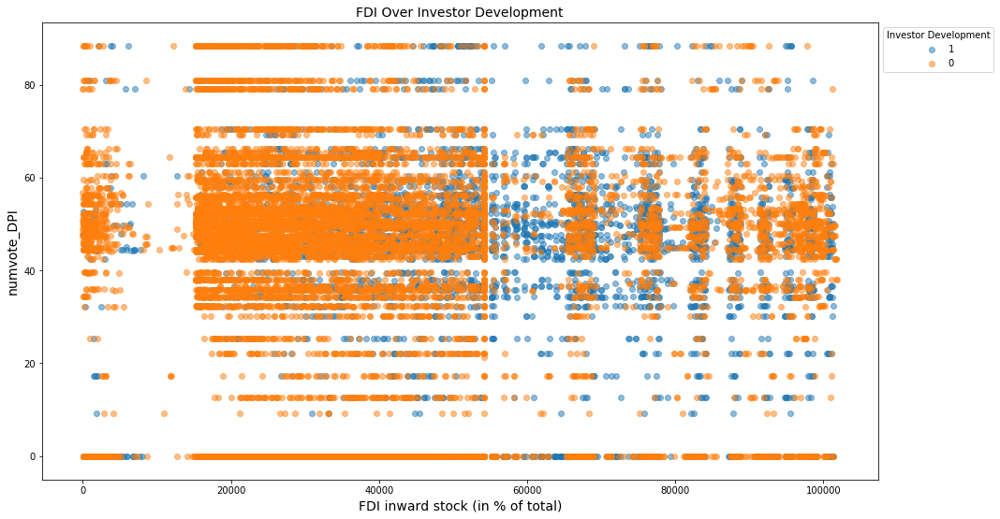

In [452]:
graph_fdi_by_var_over_investor_development(var, [])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, var, [])

--

--

### Number of Opposition Seats [DPI] - numopp_DPI

In [454]:
var = "numopp_DPI"

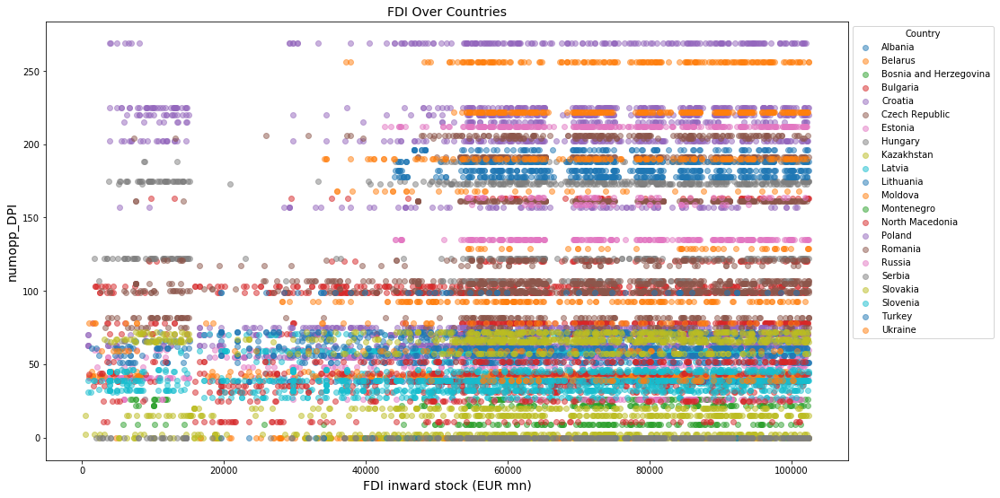

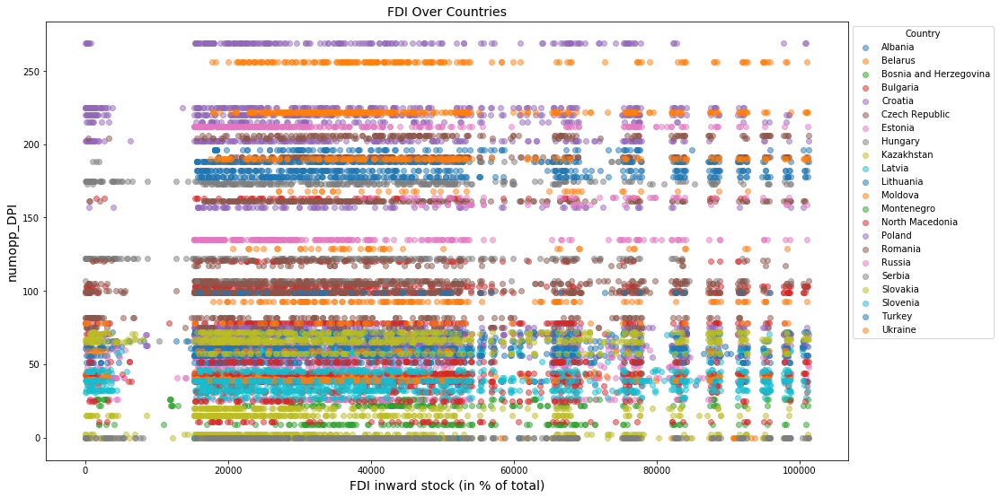

In [455]:
graph_fdi_by_var_over_countries(var,
                                [no_world_filter, no_EU_entity])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, var, [])

--

--

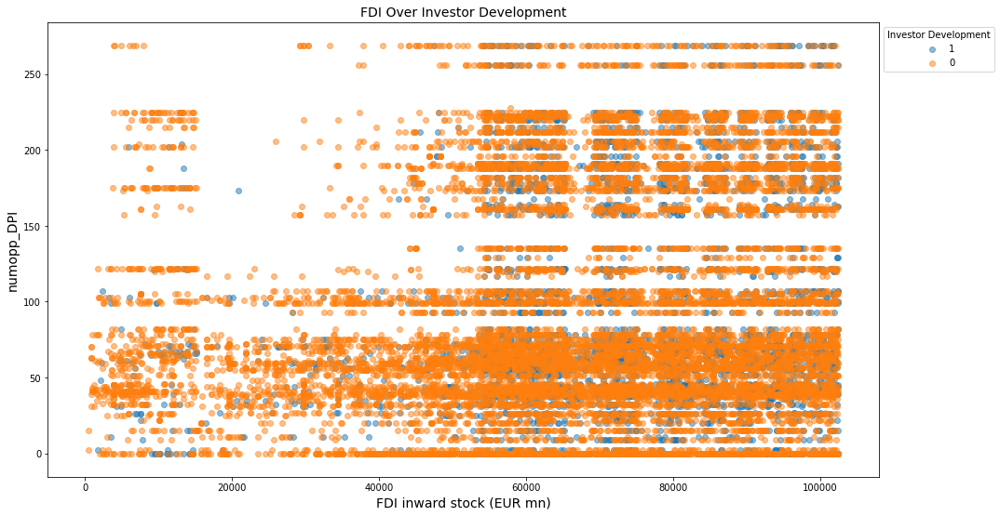

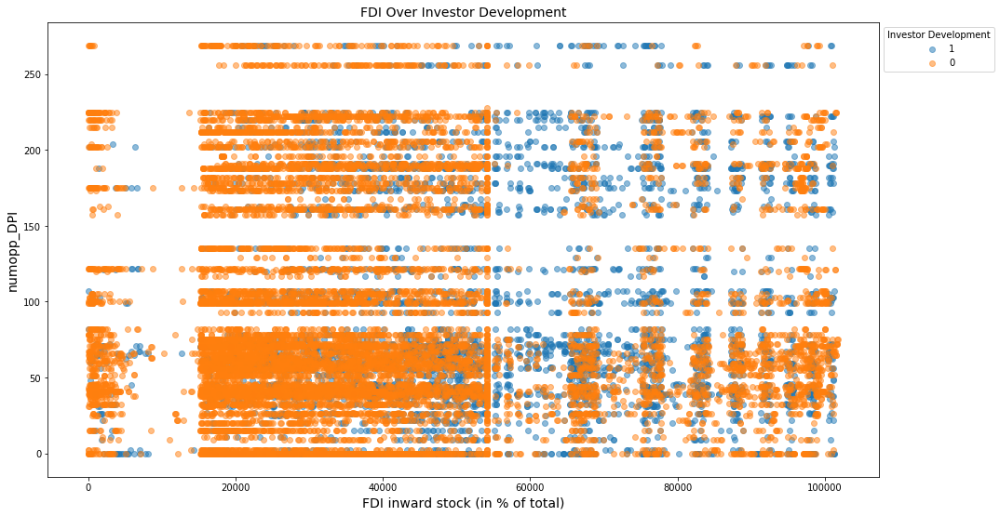

In [457]:
graph_fdi_by_var_over_investor_development(var, [])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, var, [])

--

--

I think this may be a great variable to look into how FDI might be used for political purposes. However, importantly, we need a variable for *change* in number of opposition seats. 

### Vote Share of Opposition Parties [DPI] - oppvote_DPI

In [459]:
var = "oppvote_DPI"

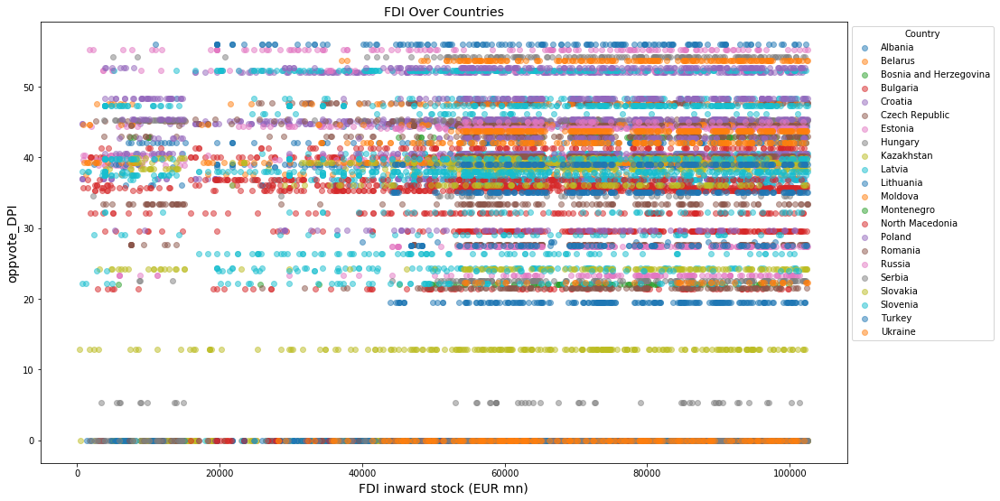

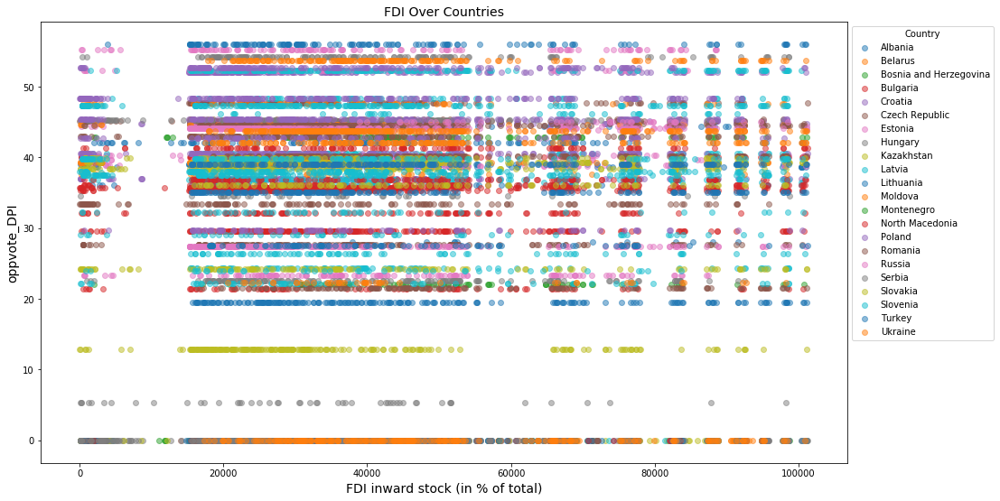

In [460]:
graph_fdi_by_var_over_countries(var,
                                [no_world_filter, no_EU_entity])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, var, [])

--

--

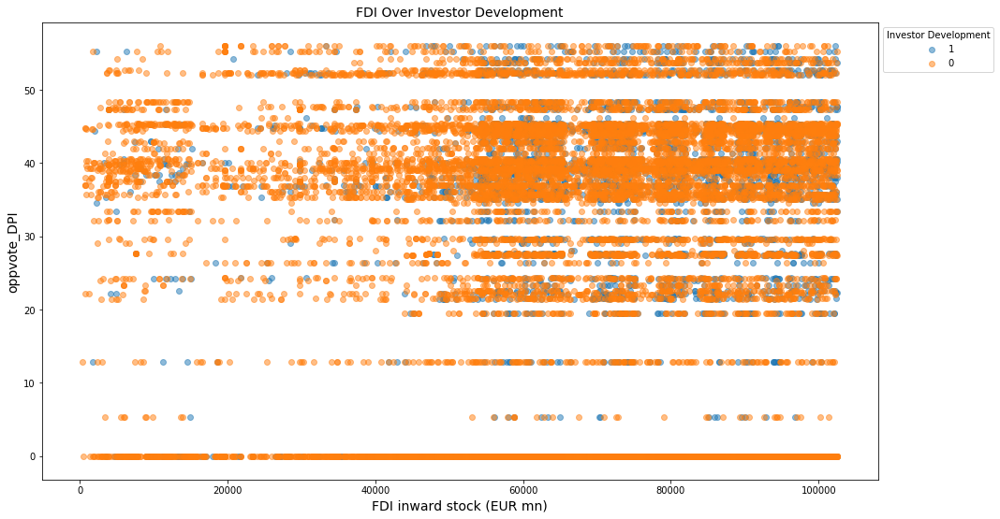

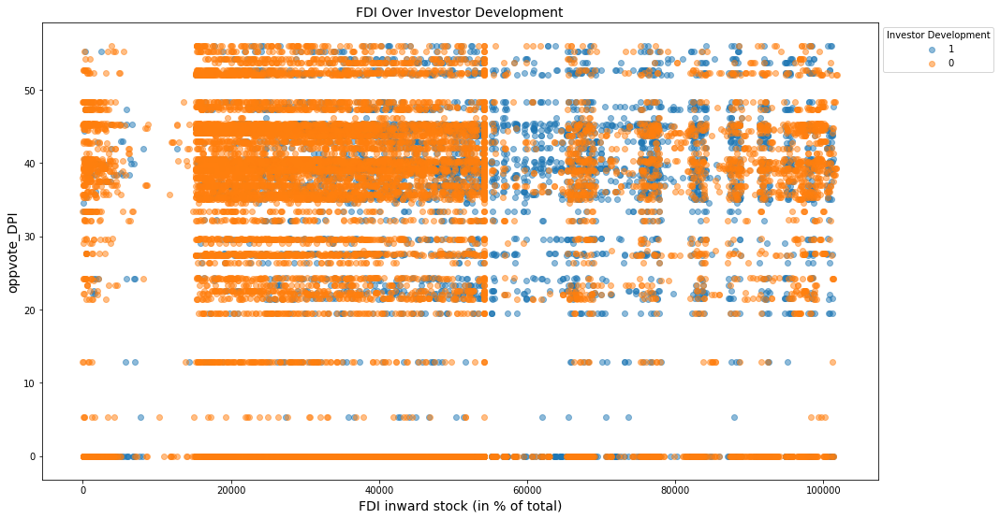

In [462]:
graph_fdi_by_var_over_investor_development(var, [])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_invesotr_development_indiv_countries(country, var, [])

--

--

### Margin of Majority [DPI] - maj_DPI

Almost 77% of the data available.

Probably need to look at change for plots. 

### Number of Seats of Largest Government Party [DPI] - gov1seat_DPI

About 84% of data available. 

Probably need to look at change for plots. 

### Vote Share of Largest Government Party [DPI] - gov1vote_DPI

About 71% of data available. 

Probably need to look at change for plots. 

### Number of Seats of 2nd Largest Government Party [DPI] - gov2seat_DPI

About 84% of data available. 

Probably need to look at change for plots. 

### Vote Share of 2nd Largest Government Party [DPI] - gov2vote_DPI

About 75% of data available. 

Probably need to look at change for plots. 

### Number of Seats of Largest Opposition Party [DPI] - opp1seat_DPI

About 83% of data available. 

Probably need to look at change for plots. 

### Vote Share of Largest Opposition Party [DPI] - opp1vote_DPI

About 72% of data available. 

Probably need to look at change for plots. 

### Combined polity score [P4] - polity_P4

About 87% of data available. 

Probably need to look at change for plots. 

### Regime durability [P4] - durable_P4

About 87% of data available. 


Probably need to look at change for plots. 

### Political competition [P4] - polcomp_P4

About 87% of data available. 

Probably need to look at change for plots. 

### Total change in polity value [P4] - change_P4

Too much missing data - about 11% available. 

### Liberal democracy index [VDEM] - v2x_libdem_VDEM

In [466]:
var = "v2x_libdem_VDEM"

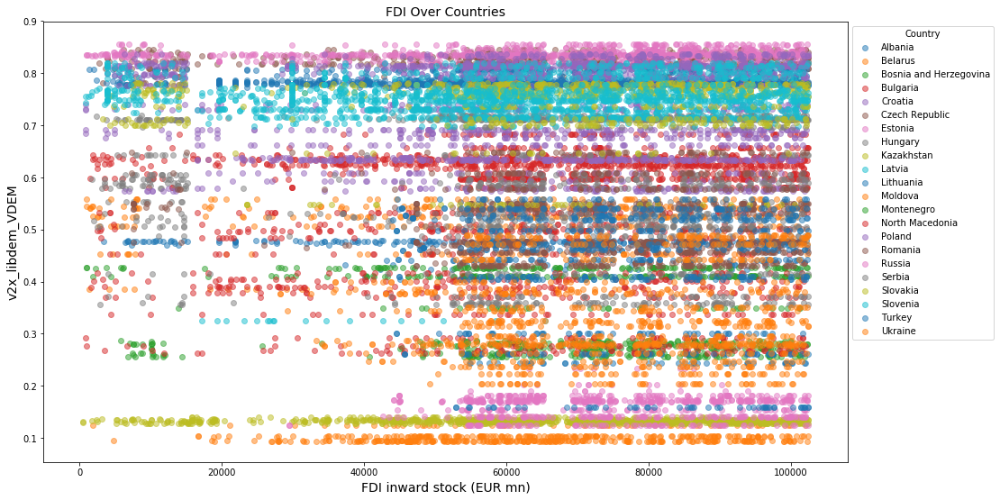

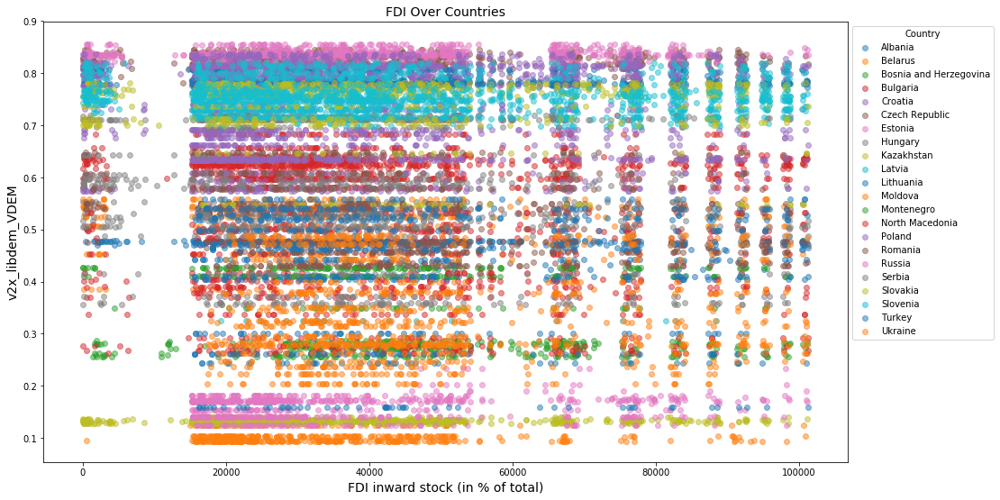

In [467]:
graph_fdi_by_var_over_countries(var,
                                [no_world_filter, no_EU_entity])

--

--

In [ ]:
for country in countries:
    graph_fdi_by_var_over_indiv_countries(country, var, [])

--

--

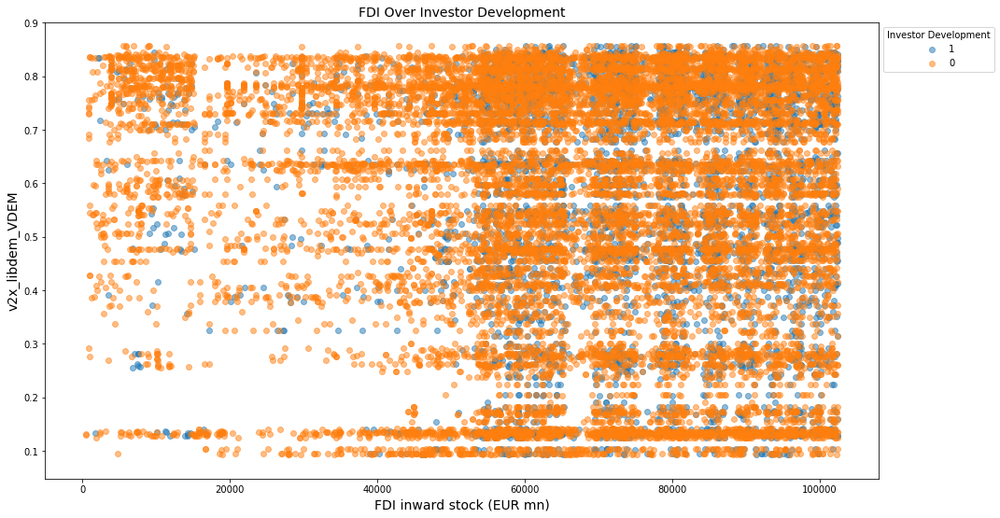

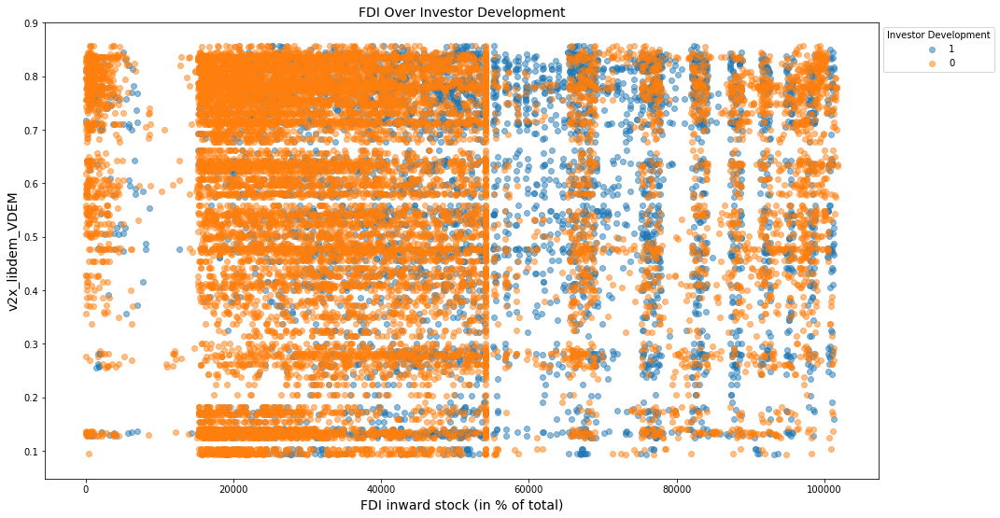

In [468]:
graph_fdi_by_var_over_investor_development(var, [])

--

--

Perhaps some correlation, but probably need to look at change. 

### Judicial constraints on the executive index [VDEM] - v2x_jucon_VDEM

### Civil society participation index [VDEM ] - v2x_cspart_VDEM

### Political corruption [VDEM] - v2x_corr_VDEM

In [470]:
var = "v2x_corr_VDEM"

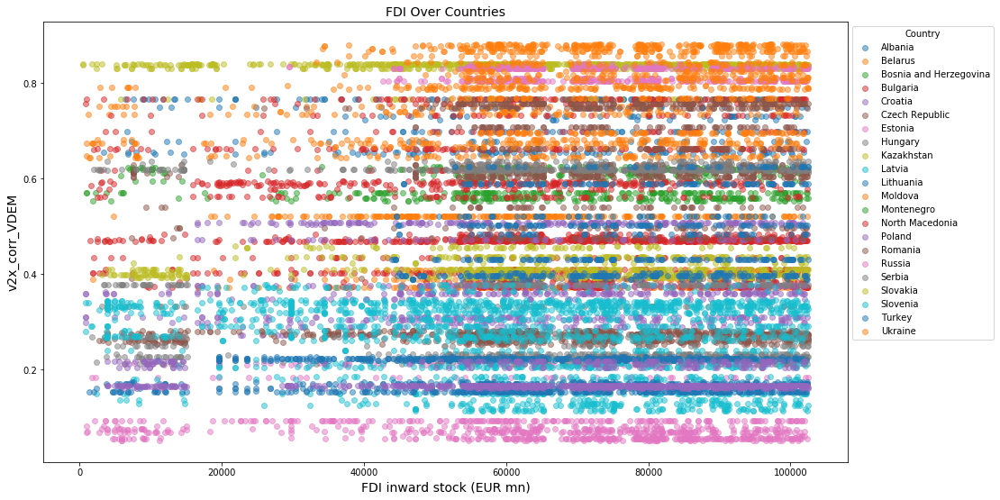

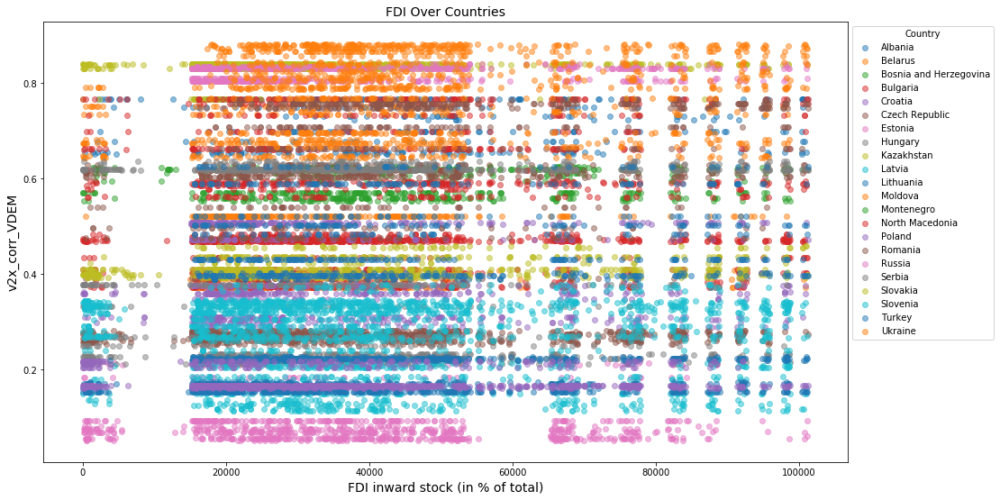

In [471]:
graph_fdi_by_var_over_countries(var,
                                [no_world_filter, no_EU_entity])

### Public sector corruption index [VDEM] - v2x_pubcorr_VDEM

### Executive corruption index [VDEM - v2x_execorr_VDEM

### Division of power index [VDEM] - v2x_feduni_VDEM

### High court independence [VDEM] - v2juhcind_VDEM

### Government compliance with high court [VDEM] - v2juhccomp_VDEM